# Library

In [ ]:
import pandas as pd
import numpy as np
import gzip
import sys
sys.path.append('../../../Util')
import BERTopicUtils as btu
from llama_cpp import Llama
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP
import hdbscan
from bertopic.vectorizers import ClassTfidfTransformer
from transformers import pipeline
import torch

## 6° Baseline Summary: Specific Topics

### Clustering Approach

- **Parameter Setting**:
  - Embedding Model: all-MiniLM-L6-v2
  - Representation Model: keyBERTInspired, MaximalMarginalRelevance
  - Count Vectorizer
  - CtfIDF
  - UMAP: 150 neighbors, 10 components
  - HDBSCAN: 500 min cluster size
  - Zero-Shot Classification on cluster name
  - Outliers-reduction with Probabilites: 0.092 threshold

### Clustering Results

- **Clusters Retrieved**: 31 in which the most important ones concern:
  1. Socialism
  2. Elections Fraud America
  3. Racism Mexico
  4. Israel War
  5. Elections Europe
  6. Deep State
  7. Trump
  8. Climate Change
  9. White Racism
  10. Coronavirus
  11. Big Tech
  12. Religion


- **Performance Metrics**:
  - **Silhouette Score**: 0.62
  - **Davies-Bouldin Score**: 0.42
  - **Coherence-Score**: 0.51
  - **Dos Score**: 0.2
  - **%Outliers**: 0.32 (16.8k/52.3k)

# Process Data

In [2]:
df = btu.load_data_filtered('../../../Datasets/CleanedData/threads_raid_cleaned_content_created_preprocessed.csv', 'name')

94407


In [51]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
model = SentenceTransformer('all-MiniLM-L6-v2', device=device)

Using device: cpu


In [4]:
corpus = btu.get_corpus(df, 'name', lower=False)
embeddings = model.encode(corpus, batch_size=64, show_progress_bar=True)

Batches: 100%|██████████| 1476/1476 [06:10<00:00,  3.99it/s]


In [5]:
np.savez_compressed('PreProcessFiles/threads_preprocessed_embeddings_raids.npz', embeddings)
with gzip.open('PreProcessFiles/threads_preprocessed_corpus_raids.txt.gz', 'wt') as f:
    for word in corpus:
        f.write(word + '\n')

In [3]:
with np.load('PreProcessFiles/threads_preprocessed_embeddings_raids.npz') as data:
    embeddings = data['arr_0']

with gzip.open('PreProcessFiles/threads_preprocessed_corpus_raids.txt.gz', 'rt') as f:
    corpus = f.read().split('\n')

corpus.pop()

''

# Train Model

In [5]:
mmr = MaximalMarginalRelevance(diversity=0.4)
kw = KeyBERTInspired()
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 4), min_df=10, max_df=0.7)
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
umap_model = UMAP(n_neighbors=150, n_components=10, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=500, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

topic_model = BERTopic(
    top_n_words=10, 
    n_gram_range=(1, 4),
    umap_model=umap_model, 
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model, 
    ctfidf_model=ctfidf_model, 
    representation_model=[mmr, kw],
    embedding_model=SentenceTransformer('all-MiniLM-L6-v2'),
    calculate_probabilities=True,
    verbose=True
)

topics, probs = topic_model.fit_transform(corpus, embeddings)

2024-08-05 13:16:27,336 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-08-05 13:30:41,779 - BERTopic - Dimensionality - Completed ✓
2024-08-05 13:30:41,893 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-08-05 13:32:28,036 - BERTopic - Cluster - Completed ✓
2024-08-05 13:32:28,341 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-08-05 13:32:42,443 - BERTopic - Representation - Completed ✓


In [6]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 5))
topic_model.update_topics(corpus, vectorizer_model=vectorizer_model)
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,45008,-1_free_accounts_new_account,"[free, accounts, new, account, best, logs, onl...",[Altsgenie Premium Acc Porn websites Accounts ...
1,0,7749,0_database_data_db_databases,"[database, data, db, databases, dump, usa, dbs...",[FREE india insurance company policy informati...
2,1,5155,1_hacking_security_course_windows,"[hacking, security, course, windows, android, ...","[Windows Source Code z, WiFi Hacking Full Cour..."
3,2,4304,2_mega_onlyfans_collection_gb,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",[MEGA MiaRand Closeup dildo mastrubation gb po...
4,3,4291,3_email_pass_mail_email pass,"[email, pass, mail, email pass, access, mail a...","[email combo USA MAIL PASS, k Fresh Mail Acces..."
5,4,3376,4_dodgy_henlo_dodgy dodgy_dodgy dodgy dodgy,"[dodgy, henlo, dodgy dodgy, dodgy dodgy dodgy,...","[Indica vs, Nurmagomedov vs Gaethje, vs tozzette]"
6,5,2961,5_combo_combolist_hq_private,"[combo, combolist, hq, private, gaming, combos...",[k Highest Quality Gaming Combolist k Hits Gam...
7,6,2469,6_accounts_account_premium_capture,"[accounts, account, premium, capture, origin, ...","[x Origin Capture, X ORIGIN COUNTS CAPTURE HQ ..."
8,7,2275,7_htb_flag_writeup_hackthebox,"[htb, flag, writeup, hackthebox, root, flags, ...",[Cache Active Machine Credential SSH Get Flags...
9,8,2024,8_leak_leaked_leaked download_database leaked,"[leak, leaked, leaked download, database leake...","[K Egyptian Azhar Students data leaked, state ..."


# Evaluation

In [7]:
umap_embeddings = topic_model.umap_model.fit_transform(embeddings)

In [8]:
sihouette_davies_score = btu.calculate_silhouette_davies(umap_embeddings, topics)
coherence_score = btu.evaluate_topic_coherence(topic_model.get_topics(), corpus)
dos_score = btu.calculate_dos(topic_model.get_topics())

Silhouette Score: 0.6661595702171326
Davies-Bouldin Score: 0.3903714607142714
Coherence Model: 0.5360885856797469
Distinta Overlap Score: 0.1794871794871795


In [9]:
topic_model.visualize_topics()

In [15]:
new_topics = topic_model.reduce_outliers(corpus, topics, strategy="probabilities", probabilities=probs, threshold=0.092)
topic_model.update_topics(corpus, topics=new_topics)
topic_model.get_topic_info()

2024-08-05 14:11:50,071 - BERTopic - WARNING: Using a custom list of topic assignments may lead to errors if topic reduction techniques are used afterwards. Make sure that manually assigning topics is the last step in the pipeline.Note that topic embeddings will also be created through weightedc-TF-IDF embeddings instead of centroid embeddings.


,Topic,Count,Name,Representation,Representative_Docs
0,-1,36319,-1_free_how_accounts_logs,"[free, how, accounts, logs, the, new, get, onl...",[Altsgenie Premium Acc Porn websites Accounts ...
1,0,7773,0_database_data_db_databases,"[database, data, db, databases, dump, usa, dbs...",[FREE india insurance company policy informati...
2,1,5313,1_hacking_security_course_windows,"[hacking, security, course, windows, hacker, a...","[Windows Source Code z, WiFi Hacking Full Cour..."
3,2,4326,2_mega_onlyfans_collection_gb,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",[MEGA MiaRand Closeup dildo mastrubation gb po...
4,3,4292,3_email_pass_mail_email pass,"[email, pass, mail, email pass, access, mail a...","[email combo USA MAIL PASS, k Fresh Mail Acces..."
5,4,4707,4_the_kek_de_dodgy,"[the, kek, de, dodgy, vs, le, ello, henlo, dod...","[Indica vs, Nurmagomedov vs Gaethje, vs tozzette]"
6,5,2961,5_combo_combolist_hq_private,"[combo, combolist, hq, private, gaming, combos...",[k Highest Quality Gaming Combolist k Hits Gam...
7,6,3649,6_accounts_account_premium_capture,"[accounts, account, premium, capture, with, pr...","[x Origin Capture, X ORIGIN COUNTS CAPTURE HQ ..."
8,7,2275,7_htb_flag_writeup_hackthebox,"[htb, flag, writeup, hackthebox, root, flags, ...",[Cache Active Machine Credential SSH Get Flags...
9,8,2027,8_leak_leaked_leaked download_database leaked,"[leak, leaked, leaked download, database leake...","[K Egyptian Azhar Students data leaked, state ..."


In [16]:
sihouette_davies_score = btu.calculate_silhouette_davies(umap_embeddings, new_topics)
coherence_score = btu.evaluate_topic_coherence(topic_model.get_topics(), corpus)
dos_score = btu.calculate_dos(topic_model.get_topics())

Silhouette Score: 0.6155701875686646
Davies-Bouldin Score: 0.4781450608395216
Coherence Model: 0.5069455703775064
Distinta Overlap Score: 0.19658119658119658


In [17]:
topic_model.visualize_topics()

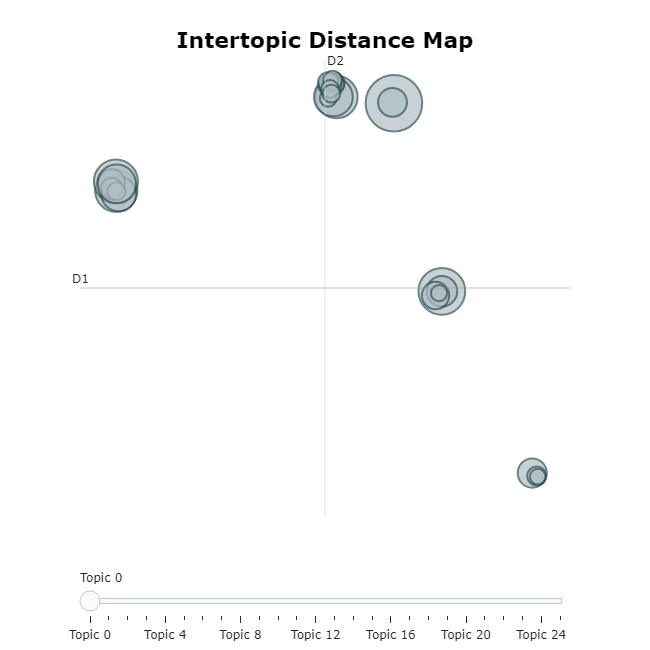

In [18]:
reduced_embeddings = UMAP(n_neighbors=150, n_components=2, 
                          min_dist=0.0, metric='cosine').fit_transform(embeddings)

In [19]:
topic_model.visualize_documents(corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, hide_annotations=True)

# LLAMA

In [20]:
# Use llama.cpp to load a Quantized LLM
llm = Llama(model_path="../../../openhermes-2.5-mistral-7b.Q4_K_M.gguf", n_gpu_layers=-1, n_ctx=9096, stop=["Q:", "\n"])

llama_model_loader: loaded meta data with 20 key-value pairs and 291 tensors from ../../../openhermes-2.5-mistral-7b.Q4_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = teknium_openhermes-2.5-mistral-7b
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u32              = 32
llama_model_loader: - kv   5:                  llama.feed_forward_length u32              = 14336
llama_model_loader: - kv   6:                 llama.rope.dimension_count u32              = 128
llama_model_loader: - kv   7:         

In [21]:
topic_names = topic_model.get_topic_info()[['Topic', 'Representation', 'Representative_Docs']]
topic_names = topic_names[topic_names['Topic'] != -1]
topic_label = btu.process_dataset(llm, topic_names)

Processing dataset:   0%|          | 0/26 [00:00<?, ?it/s]
llama_print_timings:        load time =   52897.29 ms
llama_print_timings:      sample time =      16.82 ms /    16 runs   (    1.05 ms per token,   951.42 tokens per second)
llama_print_timings: prompt eval time =   52892.95 ms /   114 tokens (  463.97 ms per token,     2.16 tokens per second)
llama_print_timings:        eval time =   66797.65 ms /    15 runs   ( 4453.18 ms per token,     0.22 tokens per second)
llama_print_timings:       total time =  119961.02 ms /   129 tokens
Processing dataset:   4%|▍         | 1/26 [02:00<50:05, 120.23s/it]Llama.generate: prefix-match hit

llama_print_timings:        load time =   52897.29 ms
llama_print_timings:      sample time =       2.63 ms /     7 runs   (    0.38 ms per token,  2663.62 tokens per second)
llama_print_timings: prompt eval time =   25618.87 ms /    99 tokens (  258.78 ms per token,     3.86 tokens per second)
llama_print_timings:        eval time =    2345.10 ms /   

In [27]:
topic_label.to_csv('LLAMA/topic_model_all_MiniLM-L6-v2_500_150n_10dim_LLAMA_results_raid_forums.csv')
new_topics = pd.read_csv('LLAMA/topic_model_all_MiniLM-L6-v2_500_150n_10dim_LLAMA_results_raid_forums.csv')

In [28]:
topic_model.set_topic_labels(new_topics.set_index('Topic')['Label'].to_dict())

# Show Graphs

In [29]:
topic_model.visualize_barchart(top_n_topics=100, n_words=10, width=350, height=350, custom_labels=True)

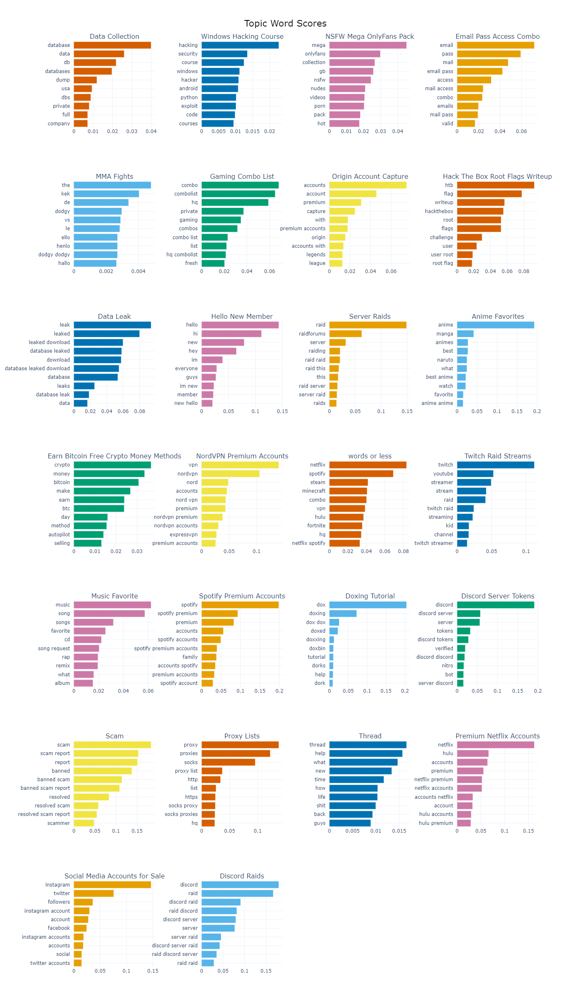

In [30]:
topic_model.visualize_hierarchy(custom_labels=True)

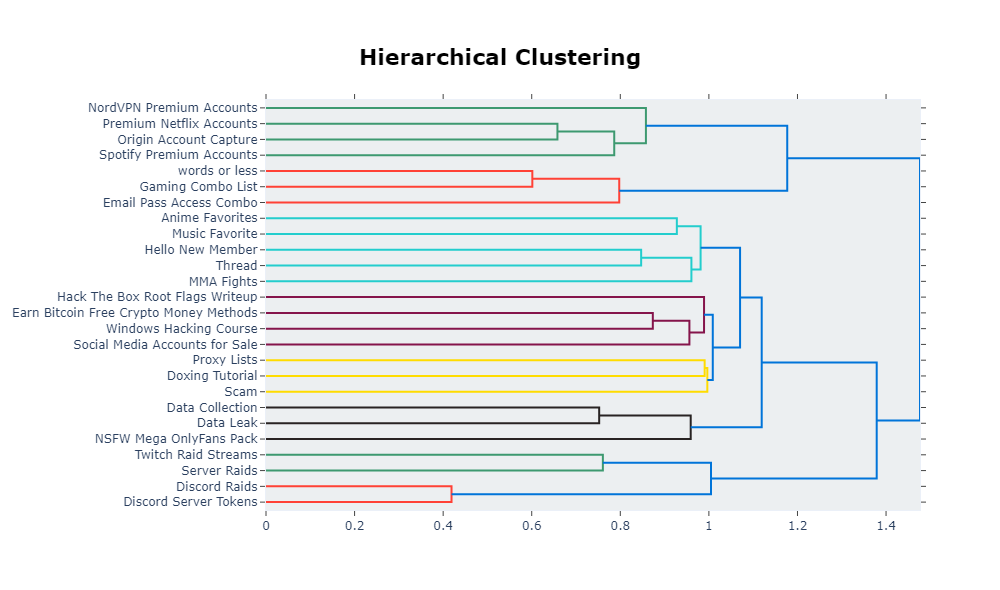

In [31]:
topic_model.visualize_heatmap(custom_labels=True)

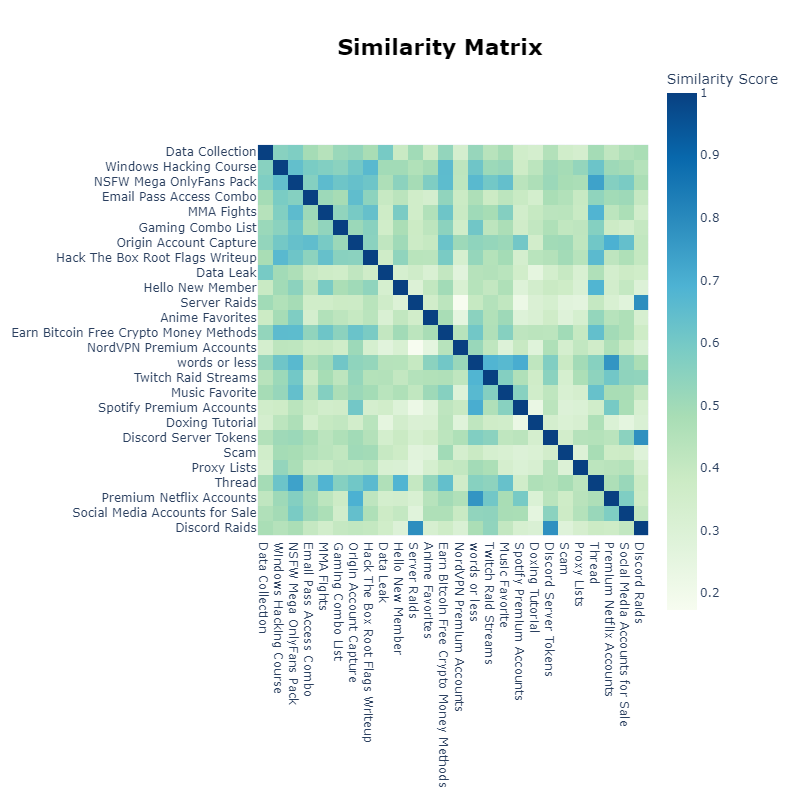
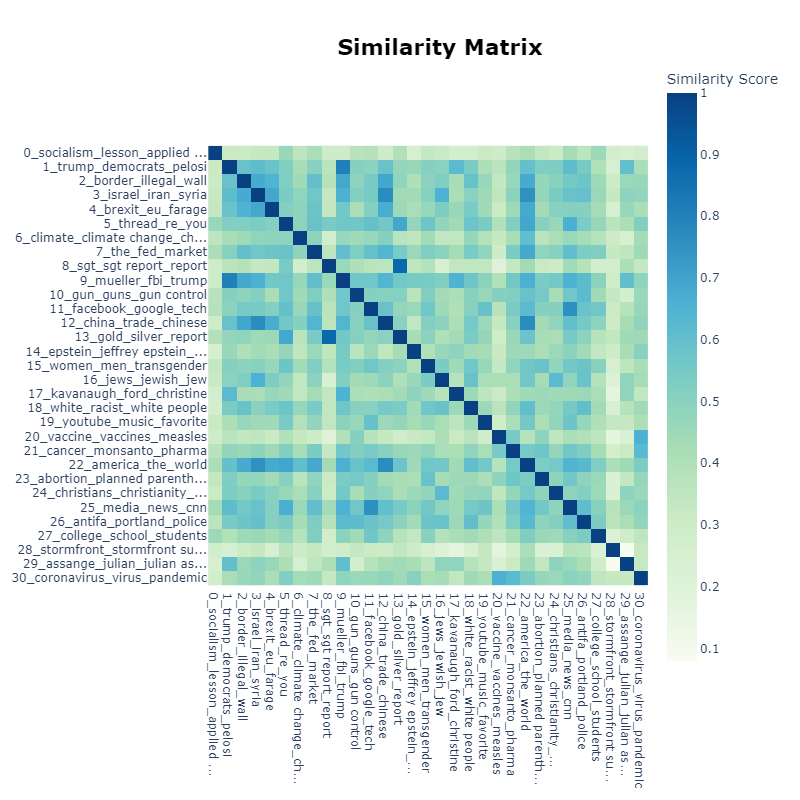
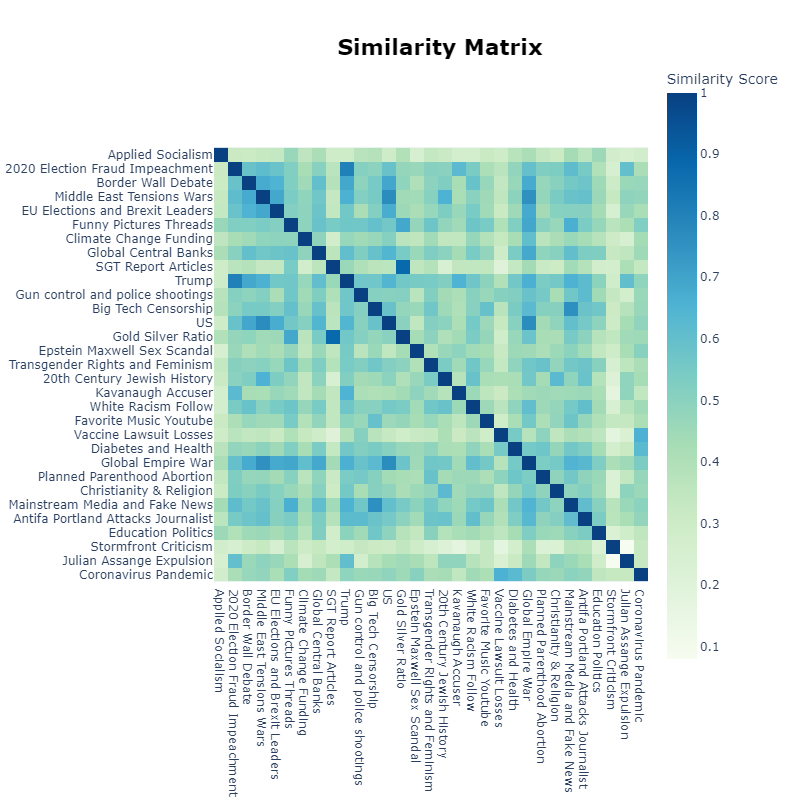
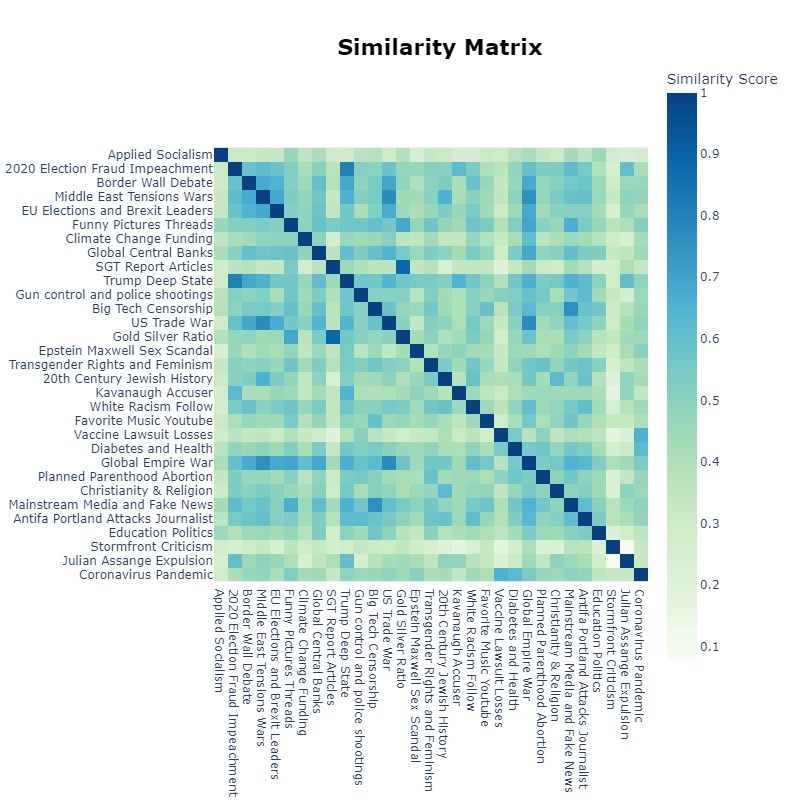
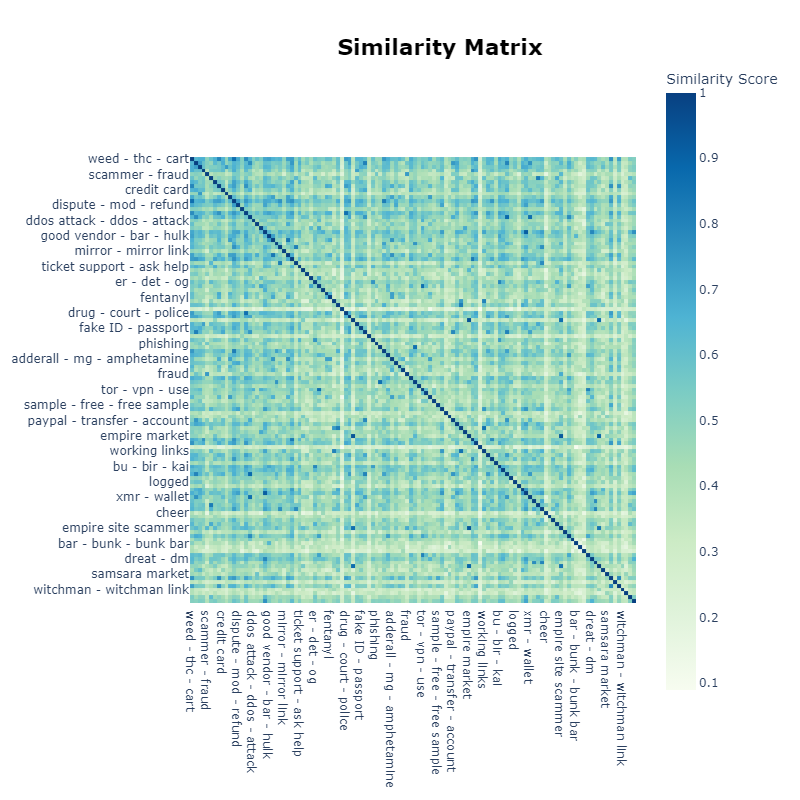

In [32]:
topic_model.visualize_documents(corpus, reduced_embeddings=reduced_embeddings, 
                                hide_document_hover=True, custom_labels=True)

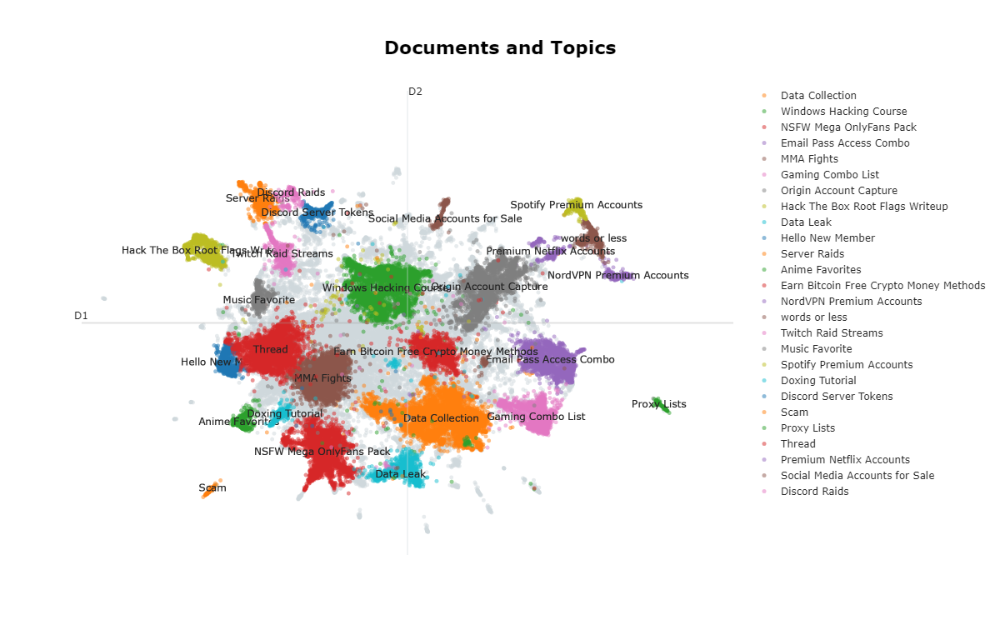

In [ ]:
topic_model.visualize_hierarchical_documents(corpus, topic_model.hierarchical_topics(corpus), reduced_embeddings=reduced_embeddings, custom_labels=True, hide_document_hover=True)

In [ ]:
topic_model.visualize_document_datamap(corpus, reduced_embeddings=reduced_embeddings, custom_labels=True)

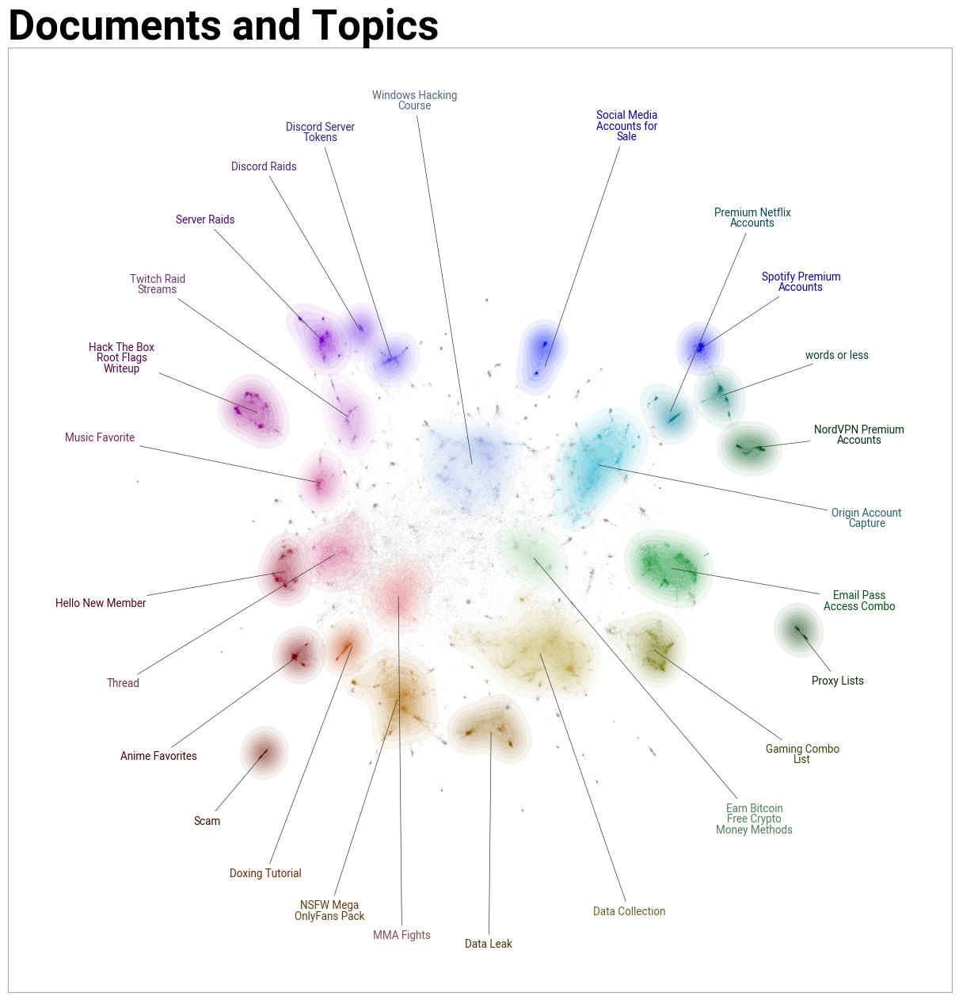

In [37]:
topic_model.visualize_term_rank(log_scale=True, custom_labels=True)

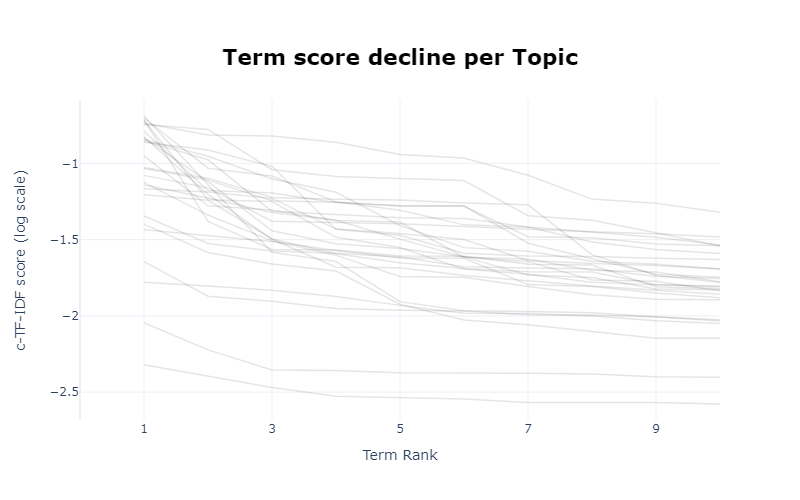

# Evolution Over Time

In [42]:
df = btu.load_data_filtered('../../../Datasets/CleanedData/threads_raid_cleaned_content_created_preprocessed.csv', 'name')
df.drop_duplicates(subset='name', inplace=True)
df.dropna(subset=['name'], inplace=True)
created_on = df['created_on_converted'].tolist()

94407


In [45]:
topics_over_time = topic_model.topics_over_time(corpus, created_on, nr_bins=3)
topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=15, width=1250, height=700, custom_labels=True)

2it [00:29, 14.78s/it]


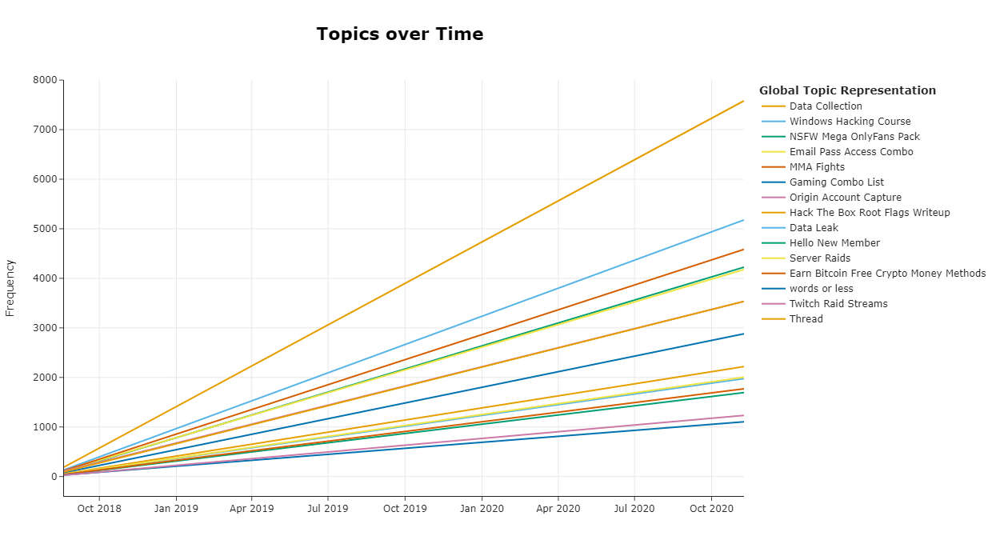

# Save Data

In [46]:
topics_over_time[topics_over_time['Topic'] != -1].sort_values(by=['Topic', 'Timestamp']).to_csv('DatasetsThreadBERTopic/BERTopic_all-MiniLM-L6-v2_500_150n_10dim_topics_over_time_3_raid.csv', index=False)

In [47]:
topics_over_time = topic_model.topics_over_time(corpus, created_on, nr_bins=5)
topics_over_time[topics_over_time['Topic'] != -1].sort_values(by=['Topic', 'Timestamp']).to_csv('DatasetsThreadBERTopic/BERTopic_all-MiniLM-L6-v2_500_150n_10dim_topics_over_time_5_raid.csv', index=False)

3it [00:39, 13.28s/it]


In [48]:
results_final = btu.return_dataset(corpus, created_on, embeddings, topic_model.topics_, probs, topic_model, umap_embeddings)
print(results_final.shape)
results_final.head()

(58088, 11)


,Document,Embedding,Topic,Probability,Created_on,Count,Name,CustomName,Representation,Representative_Docs,UMAP_embedding
0,NORDVPN EMAIL PASSWORD,"[-0.05301557, 0.03258508, -0.02295541, -0.0170...",13,"[0.005290109810140589, 0.006342146672603294, 0...",2021-12-16,1017,13_vpn_nordvpn_nord_accounts,NordVPN Premium Accounts,"[vpn, nordvpn, nord, accounts, nord vpn, premi...","[NordVpn Premium Account x With Capture, NORDV...","[6.966839, 9.079782, 1.5851698, 3.293567, 8.26..."
1,Multiple private DBs sale,"[0.004589252, -0.06877419, -0.056578204, -0.02...",0,"[0.15163478991658433, 0.02341946690347239, 0.0...",2021-12-16,7773,0_database_data_db_databases,Data Collection,"[database, data, db, databases, dump, usa, dbs...",[FREE india insurance company policy informati...,"[3.3618782, 9.313049, -0.39772025, 0.5047134, ..."
2,Twitch Experiances,"[-0.043933567, -0.102266565, 0.03943628, -0.01...",15,"[2.367664478771414e-308, 3.25020176139453e-308...",2021-12-16,1260,15_twitch_youtube_streamer_stream,Twitch Raid Streams,"[twitch, youtube, streamer, stream, raid, twit...","[Autistic Twitch Stream Raid, twitch stream ra...","[3.0585883, 9.555653, 4.455286, 1.9062394, 8.5..."
3,Hello Raidforum,"[-0.01596901, -0.052934494, -0.105957784, -0.0...",10,"[0.012288272795892235, 0.015696471480768238, 0...",2021-12-16,2056,10_raid_raidforums_server_raiding,Server Raids,"[raid, raidforums, server, raiding, raid raid,...","[It raid broski, LUL RAID THIS, Please raid go...","[2.0480123, 10.071316, 5.996019, 2.1886282, 9...."
4,Discord Server Neo Nazi diaper fetish,"[-0.003691436, -0.020491593, 0.0019388354, -0....",19,"[0.0060431293909288105, 0.008447427785526096, ...",2021-12-16,881,19_discord_discord server_server_tokens,Discord Server Tokens,"[discord, discord server, server, tokens, disc...","[Discord server, Discord discord, DISCORD FUCK...","[2.598007, 9.933029, 4.119186, 2.1107252, 9.39..."


In [54]:
results_final[['Document', 'Topic', 'Probability', 'Created_on', 'Count', 'Name', 'CustomName', 'Representation', 'Representative_Docs']].to_parquet('DatasetsThreadBERTopic/BERTopic_all-MiniLM-L6-v2_500_150n_10dim_raid.parquet')

In [52]:
topic_model.save("Models/topic_model_all-MiniLM-L6-v2_500_150n_10dim_raid", serialization="pickle", save_ctfidf=True, save_embedding_model=model)

2024-08-05 16:08:43,669 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


In [71]:
topic_model.save("Models/topic_model_all-MiniLM-L6-v2_150_150n_10dim_white_nation_safetensors", serialization="safetensors", save_ctfidf=True, save_embedding_model=model)

# Example

In [60]:
topic_model = BERTopic.load("Models/topic_model_all-MiniLM-L6-v2_500_150n_10dim_raid", embedding_model='all-MiniLM-L6-v2')

In [61]:
sentence = ['account']
btu.predict_topic(topic_model, sentence, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]
2024-08-05 16:28:35,873 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-05 16:29:01,140 - BERTopic - Dimensionality - Completed ✓
2024-08-05 16:29:01,142 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-05 16:29:01,157 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-05 16:29:01,282 - BERTopic - Probabilities - Completed ✓
2024-08-05 16:29:01,283 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(accounts, 0.07504779220039917), (account, 0....",1.0,Origin Account Capture,"[accounts, account, premium, capture, with, pr...",account
1,"[(discord, 0.1798355522267642), (raid, 0.16686...",0.0,Discord Raids,"[discord, raid, discord raid, raid discord, di...",account
2,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.0,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",account
3,"[(hacking, 0.022707734435131164), (security, 0...",0.0,Windows Hacking Course,"[hacking, security, course, windows, hacker, a...",account
4,"[(mega, 0.04520651614339858), (onlyfans, 0.029...",0.0,NSFW Mega OnlyFans Pack,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",account


In [63]:
btu.predict_topic(topic_model, ['social media'], custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]
2024-08-05 16:29:57,360 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-05 16:29:59,050 - BERTopic - Dimensionality - Completed ✓
2024-08-05 16:29:59,051 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-05 16:29:59,053 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-05 16:29:59,199 - BERTopic - Probabilities - Completed ✓
2024-08-05 16:29:59,201 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.049669,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",social media
1,"[(hacking, 0.022707734435131164), (security, 0...",0.015226,Windows Hacking Course,"[hacking, security, course, windows, hacker, a...",social media
2,"[(leak, 0.09392037448318262), (leaked, 0.07991...",0.014923,Data Leak,"[leak, leaked, leaked download, database leake...",social media
3,"[(accounts, 0.07504779220039917), (account, 0....",0.014592,Origin Account Capture,"[accounts, account, premium, capture, with, pr...",social media
4,"[(crypto, 0.0366510073149429), (money, 0.03358...",0.014282,Earn Bitcoin Free Crypto Money Methods,"[crypto, money, bitcoin, make, earn, btc, day,...",social media


In [64]:
btu.predict_topic(topic_model, ['games'], custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]
2024-08-05 16:30:29,905 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-05 16:30:32,762 - BERTopic - Dimensionality - Completed ✓
2024-08-05 16:30:32,763 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-05 16:30:32,767 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-05 16:30:32,902 - BERTopic - Probabilities - Completed ✓
2024-08-05 16:30:32,903 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(the, 0.004786723468366589), (kek, 0.00404477...",2.240958e-01,MMA Fights,"[the, kek, de, dodgy, vs, le, ello, henlo, dod...",games
1,"[(thread, 0.016598305834427816), (help, 0.0157...",1.973387e-01,Thread,"[thread, help, what, new, time, how, life, shi...",games
2,"[(hello, 0.14336879847201603), (hi, 0.11120275...",1.573819e-01,Hello New Member,"[hello, hi, new, hey, im, everyone, guys, im n...",games
3,"[(anime, 0.19319724189082155), (manga, 0.04163...",5.652742e-11,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",games
4,"[(music, 0.06233403710864473), (song, 0.057297...",2.521715e-12,Music Favorite,"[music, song, songs, favorite, cd, song reques...",games


In [65]:
btu.predict_topic(topic_model, ['anime world'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00,  8.45it/s]
2024-08-05 16:30:48,427 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-05 16:30:50,769 - BERTopic - Dimensionality - Completed ✓
2024-08-05 16:30:50,770 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-05 16:30:50,960 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-05 16:30:51,252 - BERTopic - Probabilities - Completed ✓
2024-08-05 16:30:51,256 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(anime, 0.19319724189082155), (manga, 0.04163...",1.0,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",anime world
1,"[(discord, 0.1798355522267642), (raid, 0.16686...",0.0,Discord Raids,"[discord, raid, discord raid, raid discord, di...",anime world
2,"[(instagram, 0.146686527459099), (twitter, 0.0...",0.0,Social Media Accounts for Sale,"[instagram, twitter, followers, instagram acco...",anime world


In [66]:
btu.predict_topic(topic_model, ['token'], num_classes=1, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 16.67it/s]
2024-08-05 16:30:58,845 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-05 16:31:03,047 - BERTopic - Dimensionality - Completed ✓
2024-08-05 16:31:03,049 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-05 16:31:03,055 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-05 16:31:03,282 - BERTopic - Probabilities - Completed ✓
2024-08-05 16:31:03,284 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(discord, 0.19122388011150088), (discord serv...",0.302698,Discord Server Tokens,"[discord, discord server, server, tokens, disc...",token


In [70]:
btu.predict_topic(topic_model, ['only fanser'], num_classes=3, custom_labels=True)

Batches: 100%|██████████| 1/1 [00:00<00:00, 12.35it/s]
2024-08-05 16:31:59,445 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-08-05 16:32:02,522 - BERTopic - Dimensionality - Completed ✓
2024-08-05 16:32:02,528 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-08-05 16:32:02,537 - BERTopic - Probabilities - Start calculation of probabilities with HDBSCAN
2024-08-05 16:32:02,796 - BERTopic - Probabilities - Completed ✓
2024-08-05 16:32:02,798 - BERTopic - Cluster - Completed ✓


,Topic,Probability,Label,Words,Sentence
0,"[(mega, 0.04520651614339858), (onlyfans, 0.029...",0.064359,NSFW Mega OnlyFans Pack,"[mega, onlyfans, collection, gb, nsfw, nudes, ...",only fanser
1,"[(the, 0.004786723468366589), (kek, 0.00404477...",0.025291,MMA Fights,"[the, kek, de, dodgy, vs, le, ello, henlo, dod...",only fanser
2,"[(anime, 0.19319724189082155), (manga, 0.04163...",0.024674,Anime Favorites,"[anime, manga, animes, best, naruto, what, bes...",only fanser
